## Ottimizzazione di portafoglio
Lewinson (2020) Python for Finance Cookbook - cap. 7

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import warnings
import seaborn as sns

plt.style.use('seaborn')
sns.set_palette('cubehelix')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

from datetime import date, datetime
import numpy as np
import pandas as pd
import pandas_datareader.data as web


### Frontiera efficiente con metodo Monte Carlo - 1

Parametri

In [ ]:
n_port = 10 ** 5
n_days = 252
risky_assets = ['FB', 'TSLA', 'TWTR', 'MSFT']
risky_assets.sort()
start_date = '2018-01-01'
end_date = '2021-10-31'
n_assets = len(risky_assets)
risky_assets

['FB', 'MSFT', 'TSLA', 'TWTR']

Scarichiamo i prezzi

Downloaded 965 rows of data.


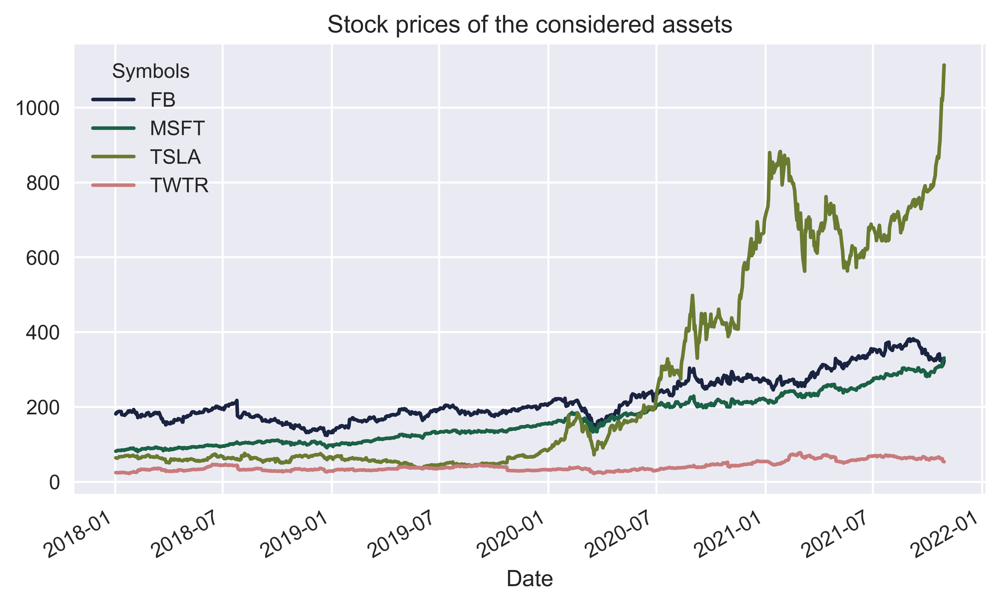

In [ ]:
prices_df = web.get_data_yahoo(risky_assets, start_date, end_date) 
print(f'Downloaded {prices_df.shape[0]} rows of data.')
prices_df['Adj Close'].plot(title='Stock prices of the considered assets');

Calcoliamo rendimenti e volatilità

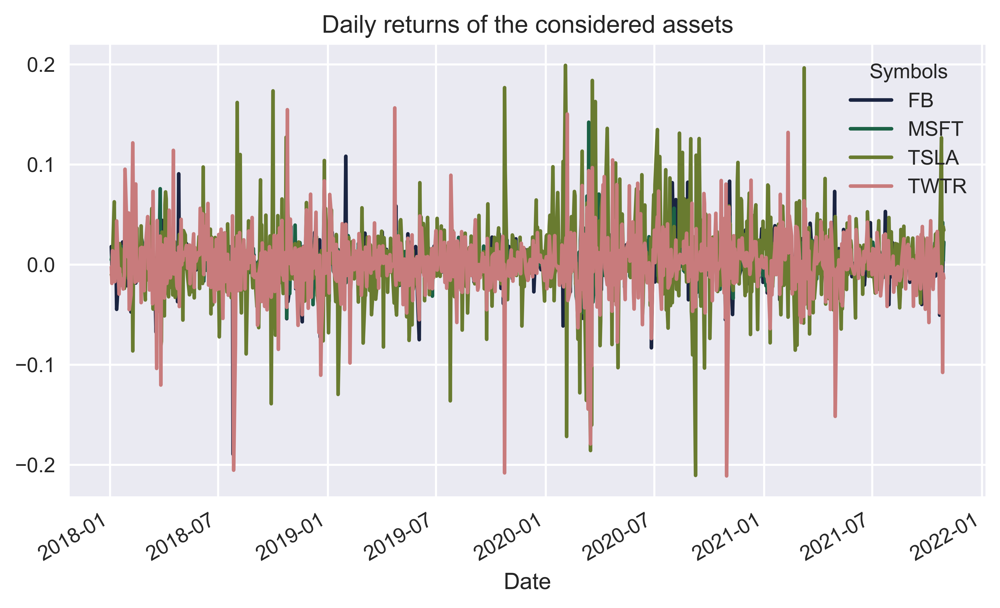

In [ ]:
returns_df = prices_df['Adj Close'].pct_change().dropna()
avg_returns = returns_df.mean() * n_days
cov_mat = returns_df.cov() * n_days
returns_df.plot(title='Daily returns of the considered assets');

Simuliamo portafogli con pesi casuali

In [ ]:


np.random.seed(42)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

Calcoliamo i rendimenti di portafoglio

In [ ]:

portf_rtns = np.dot(weights, avg_returns)

portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                    np.dot(cov_mat, weights[i]))))
portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol

Creiamo un df con tutti i dati

In [ ]:
portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                 'volatility': portf_vol,
                                 'sharpe_ratio': portf_sharpe_ratio})

Creazione della frontiera efficiente


In [ ]:

n_points = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                           n_points)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(n_points):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)
    

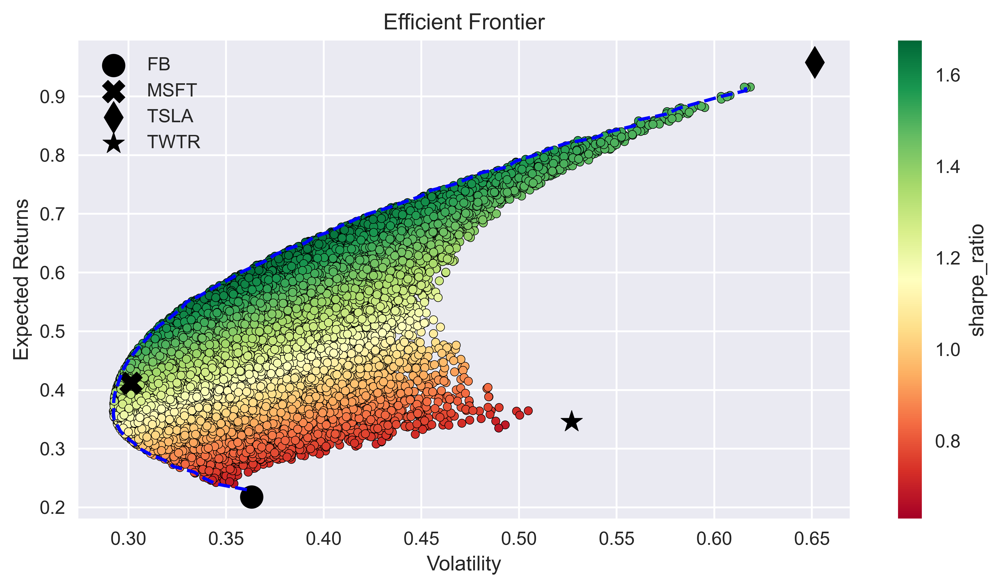

In [ ]:
MARKS = ['o', 'X', 'd', '*']

fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=risky_assets[asset_index])
ax.legend()

plt.tight_layout()
plt.show()


#### Ricerca del portafoglio con l'indice di Sharpe più alto

In [ ]:
max_sharpe_ind = np.argmax(portf_results_df.sharpe_ratio)
max_sharpe_portf = portf_results_df.loc[max_sharpe_ind]

min_vol_ind = np.argmin(portf_results_df.volatility)
min_vol_portf = portf_results_df.loc[min_vol_ind]

In [ ]:
print('Maximum Sharpe Ratio portfolio')
print('Performance')
for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(risky_assets, weights[np.argmax(portf_results_df.sharpe_ratio)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)


Maximum Sharpe Ratio portfolio
Performance
returns: 61.26% volatility: 36.57% sharpe_ratio: 167.52% 
Weights
FB: 0.74% MSFT: 62.12% TSLA: 37.06% TWTR: 0.08% 

In [ ]:
print('Minimum Volatility portfolio ----')
print('Performance')
for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)
print('\nWeights')
for x, y in zip(risky_assets, weights[np.argmin(portf_results_df.volatility)]):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio ----
Performance
returns: 36.41% volatility: 29.23% sharpe_ratio: 124.57% 
Weights
FB: 24.83% MSFT: 73.06% TSLA: 0.35% TWTR: 1.76% 

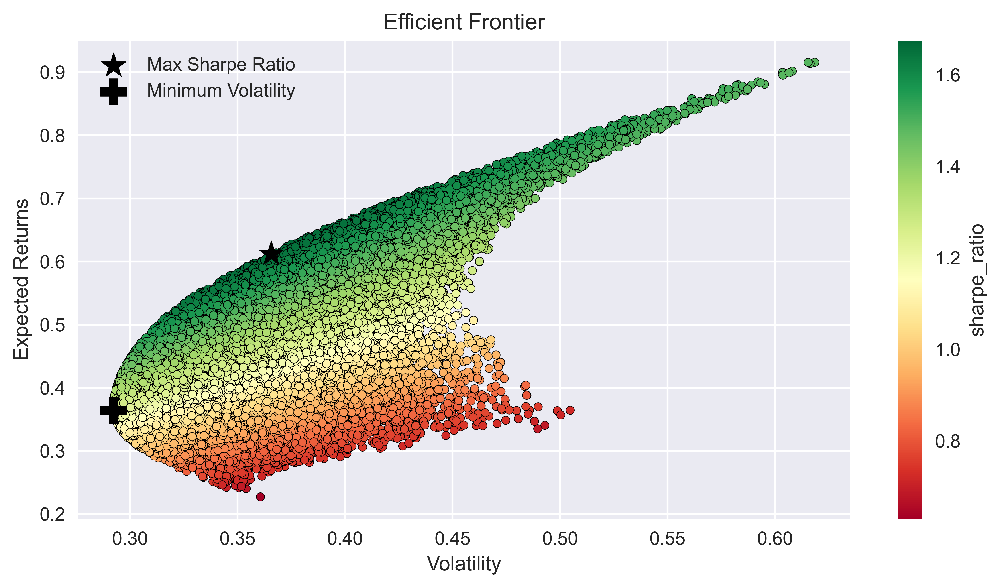

In [ ]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.scatter(x=max_sharpe_portf.volatility, 
           y=max_sharpe_portf.returns, 
           c='black', marker='*', 
           s=200, label='Max Sharpe Ratio')
ax.scatter(x=min_vol_portf.volatility, 
           y=min_vol_portf.returns, 
           c='black', marker='P', 
           s=200, label='Minimum Volatility')
ax.set(xlabel='Volatility', ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.legend()

plt.tight_layout()

plt.show()

### Frontiera efficiente con la funzione di ottimizzazione di scipy

In [ ]:
import numpy as np
import scipy.optimize as sco

In [ ]:
def get_portf_rtn(w, avg_rtns):
    return np.sum(avg_rtns * w)

def get_portf_vol(w, avg_rtns, cov_mat):
    return np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))

In [ ]:
def get_efficient_frontier(avg_rtns, cov_mat, rtns_range):
    
    efficient_portfolios = []
    
    n_assets = len(avg_returns)
    args = (avg_returns, cov_mat)
    bounds = tuple((0,1) for asset in range(n_assets))
    initial_guess = n_assets * [1. / n_assets, ]
    
    for ret in rtns_range:
        constraints = ({'type': 'eq', 
                        'fun': lambda x: get_portf_rtn(x, avg_rtns) - ret},
                       {'type': 'eq', 
                        'fun': lambda x: np.sum(x) - 1})
        efficient_portfolio = sco.minimize(get_portf_vol, initial_guess, 
                                           args=args, method='SLSQP', 
                                           constraints=constraints,
                                           bounds=bounds)
        efficient_portfolios.append(efficient_portfolio)
    
    return efficient_portfolios

In [ ]:
rtns_range = np.linspace(-0.22, 0.32, 200)

In [ ]:
efficient_portfolios = get_efficient_frontier(avg_returns, 
                                              cov_mat, 
                                              rtns_range)

In [ ]:
vols_range = [x['fun'] for x in efficient_portfolios]

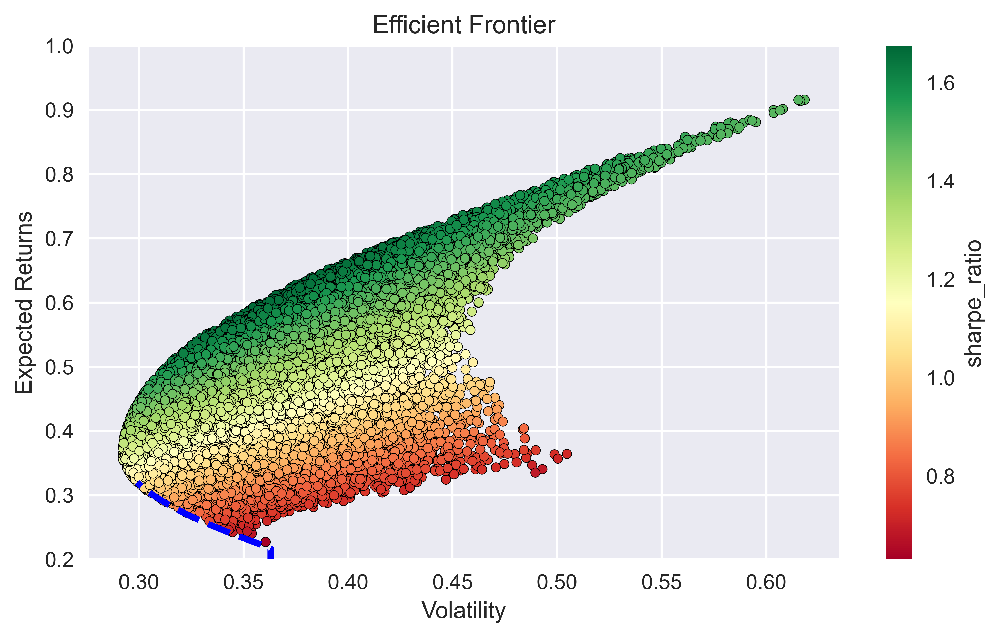

In [ ]:
fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.plot(vols_range, rtns_range, 'b--', linewidth=3)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')

plt.ylim(0.2,1)
plt.show()

Portafoglio con minima volatilità

In [ ]:
min_vol_ind = np.argmin(vols_range)
min_vol_portf_rtn = rtns_range[min_vol_ind]
min_vol_portf_vol = efficient_portfolios[min_vol_ind]['fun']

min_vol_portf = {'Return': min_vol_portf_rtn,
                 'Volatility': min_vol_portf_vol,
                 'Sharpe Ratio': (min_vol_portf_rtn / 
                                  min_vol_portf_vol)}

min_vol_portf

{'Return': 0.32,
 'Volatility': 0.29920326802562286,
 'Sharpe Ratio': 1.0695070348382565}

Sommario dei risultati

In [ ]:
print('Minimum Volatility portfolio ----')
print('Performance')

for index, value in min_vol_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, efficient_portfolios[min_vol_ind]['x']):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Minimum Volatility portfolio ----
Performance
Return: 32.00% Volatility: 29.92% Sharpe Ratio: 106.95% 
Weights
FB: 47.04% MSFT: 52.42% TSLA: 0.00% TWTR: 0.54% 

Ricerca del portafoglio con il massimo Sharpe ratio

Funzione obiettivo

In [ ]:
def neg_sharpe_ratio(w, avg_rtns, cov_mat, rf_rate):
    portf_returns = np.sum(avg_rtns * w)
    portf_volatility = np.sqrt(np.dot(w.T, np.dot(cov_mat, w)))
    portf_sharpe_ratio = (portf_returns - rf_rate) / portf_volatility
    return -portf_sharpe_ratio

Ricerca del portafoglio ottimale

In [ ]:
n_assets = len(avg_returns)
RF_RATE = 0

args = (avg_returns, cov_mat, RF_RATE)
constraints = ({'type': 'eq', 
                'fun': lambda x: np.sum(x) - 1})
bounds = tuple((0,1) for asset in range(n_assets))
initial_guess = n_assets * [1. / n_assets]

max_sharpe_portf = sco.minimize(neg_sharpe_ratio, 
                                x0=initial_guess, 
                                args=args,
                                method='SLSQP', 
                                bounds=bounds, 
                                constraints=constraints)

In [ ]:
max_sharpe_portf_w = max_sharpe_portf['x']
max_sharpe_portf = {'Return': get_portf_rtn(max_sharpe_portf_w, 
                                            avg_returns),
                    'Volatility': get_portf_vol(max_sharpe_portf_w, 
                                                avg_returns, 
                                                cov_mat),
                    'Sharpe Ratio': -max_sharpe_portf['fun']}
max_sharpe_portf

{'Return': 0.6075068188114494,
 'Volatility': 0.3620463170589007,
 'Sharpe Ratio': 1.6779809383135227}

In [ ]:
print('Maximum Sharpe Ratio portfolio ----')
print('Performance')

for index, value in max_sharpe_portf.items():
    print(f'{index}: {100 * value:.2f}% ', end="", flush=True)

print('\nWeights')
for x, y in zip(risky_assets, max_sharpe_portf_w):
    print(f'{x}: {100*y:.2f}% ', end="", flush=True)

Maximum Sharpe Ratio portfolio ----
Performance
Return: 60.75% Volatility: 36.20% Sharpe Ratio: 167.80% 
Weights
FB: 0.00% MSFT: 64.14% TSLA: 35.86% TWTR: 0.00% 

### Ottimizzazione da un altro punto di vista: l'avversione al rischio

In [ ]:
import cvxpy as cp

In [ ]:
avg_returns = avg_returns.values
cov_mat = cov_mat.values

In [ ]:
weights = cp.Variable(n_assets)
gamma = cp.Parameter(nonneg=True)
portf_rtn_cvx = avg_returns * weights 
portf_vol_cvx = cp.quad_form(weights, cov_mat)
objective_function = cp.Maximize(portf_rtn_cvx - gamma * portf_vol_cvx)
problem = cp.Problem(objective_function, 
                     [cp.sum(weights) == 1, weights >= 0])

C:\Users\s.bencini\Anaconda3\lib\site-packages\cvxpy\expressions\expression.py:558: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)


In [ ]:
N_POINTS = 25
portf_rtn_cvx_ef = np.zeros(N_POINTS)
portf_vol_cvx_ef = np.zeros(N_POINTS)
weights_ef = []
gamma_range = np.logspace(-3, 3, num=N_POINTS)

for i in range(N_POINTS):
    gamma.value = gamma_range[i]
    problem.solve()
    portf_vol_cvx_ef[i] = cp.sqrt(portf_vol_cvx).value
    portf_rtn_cvx_ef[i] = portf_rtn_cvx.value
    weights_ef.append(weights.value)

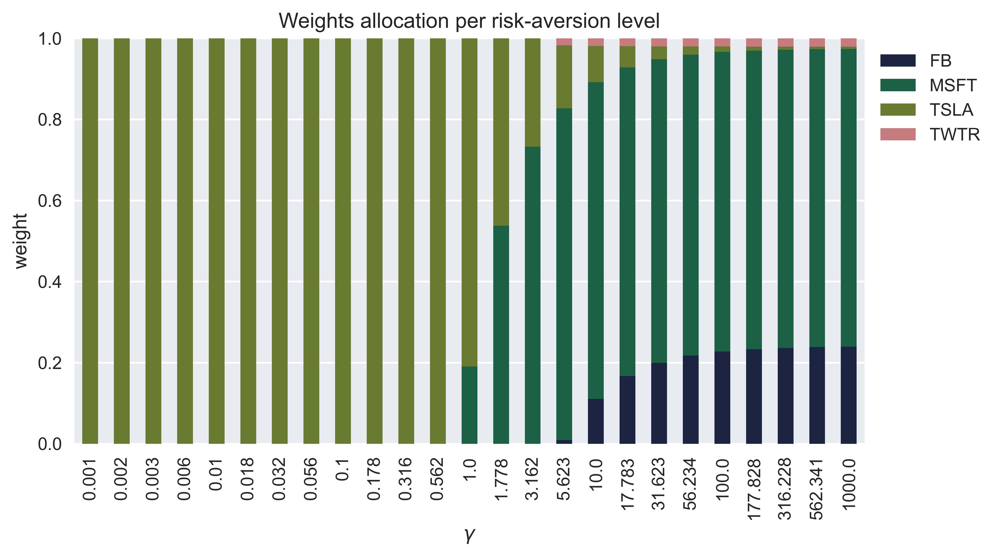

In [ ]:
weights_df = pd.DataFrame(weights_ef, 
                          columns=risky_assets, 
                          index=np.round(gamma_range, 3))
ax = weights_df.plot(kind='bar', stacked=True) 
ax.set(title='Weights allocation per risk-aversion level',
       xlabel=r'$\gamma$', 
       ylabel='weight')
ax.legend(bbox_to_anchor=(1,1))

plt.tight_layout()

plt.show()

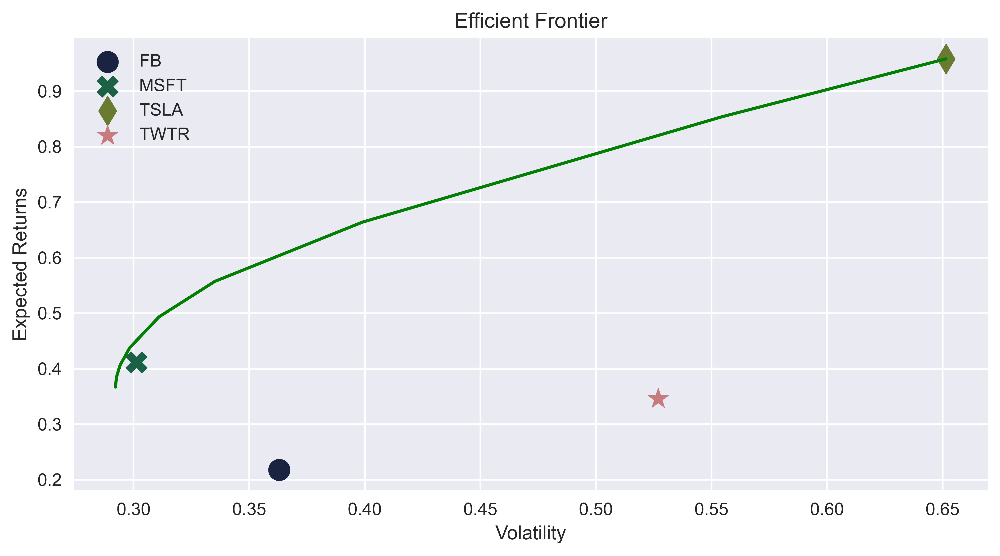

In [ ]:
#MARKS = ['o', 'X', 'd', '*']

fig, ax = plt.subplots()
ax.plot(portf_vol_cvx_ef, portf_rtn_cvx_ef, 'g-')
for asset_index in range(n_assets):
     plt.scatter(x=np.sqrt(cov_mat[asset_index, asset_index]), 
                 y=avg_returns[asset_index], 
                 marker=MARKS[asset_index], 
                 label=risky_assets[asset_index],
                 s=150)
ax.set(title='Efficient Frontier',
       xlabel='Volatility', 
       ylabel='Expected Returns', )
ax.legend()

plt.tight_layout()

plt.show()

### Frontiera efficiente con metodo Monte Carlo - 2

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import numpy as np
style.use('ggplot')

In [ ]:
data = pd.read_excel('dati_indici_20211103.xlsx', index_col = 0, parse_dates = True)

In [ ]:
data.head()

,JPCAEU3M,LG13TREH,LBEATREU,LEGATREH,NDDUWI,MXWOHEUR,NDUEEGF,NCUDWI
DATA,,,,,,,,
1999-01-31,0.002894,0.000000,0.013556,0.014568,0.060804,0.033060,0.027897,0.039463
1999-02-28,0.002295,0.005009,-0.011451,-0.014557,0.003298,-0.014425,0.040799,-0.014921
1999-03-31,0.003112,-0.001575,0.006580,0.006532,0.061535,0.044016,0.153928,0.058550
1999-04-30,0.003203,0.005897,0.010771,0.006090,0.061479,0.043849,0.147651,0.100637
1999-05-31,0.002236,0.004197,-0.005647,-0.007740,-0.024039,-0.030806,0.007252,0.001808


In [ ]:
returns = data

In [ ]:
number_of_portfolios = 40000

rf = returns['JPCAEU3M'].mean() * 12
returns.drop('JPCAEU3M', axis = 1, inplace = True)
means = returns.mean() * 12

In [ ]:
len(returns.columns)

7

In [ ]:
means

LG13TREH    0.023143
LBEATREU    0.041493
LEGATREH    0.038263
NDDUWI      0.073118
MXWOHEUR    0.063843
NDUEEGF     0.108312
NCUDWI      0.110583
dtype: float64

In [ ]:
mat_cov = returns.cov()*12

In [ ]:
print(mat_cov)

          LG13TREH  LBEATREU  LEGATREH    NDDUWI  MXWOHEUR   NDUEEGF    NCUDWI
LG13TREH  0.000098  0.000198  0.000192 -0.000485 -0.000383 -0.000370 -0.000491
LBEATREU  0.000198  0.001112  0.000806 -0.000302 -0.000298 -0.000274 -0.000298
LEGATREH  0.000192  0.000806  0.000775 -0.000623 -0.000420 -0.000477 -0.000617
NDDUWI   -0.000485 -0.000302 -0.000623  0.020966  0.018252  0.022369  0.022102
MXWOHEUR -0.000383 -0.000298 -0.000420  0.018252  0.020161  0.021017  0.019729
NDUEEGF  -0.000370 -0.000274 -0.000477  0.022369  0.021017  0.038985  0.026569
NCUDWI   -0.000491 -0.000298 -0.000617  0.022102  0.019729  0.026569  0.028913


### Ottimizzazione con rendimenti storici

In [ ]:
portfolio_returns = []
portfolio_risks = []
sharpe_ratios = []
portfolio_weights = []

for portfolio in range(number_of_portfolios):
    weights = np.random.random_sample(len(returns.columns))
    weights =np.round((weights / np.sum(weights)), 3)
    portfolio_weights.append(weights)
    annualized_return = np.sum(means * weights)
    portfolio_returns.append(annualized_return)
    portfolio_variance = np.dot(weights.T, np.dot(mat_cov, weights))
    portfolio_standard_deviation = np.sqrt(portfolio_variance)
    portfolio_risks.append(portfolio_standard_deviation)
    sharpe_ratio = (annualized_return - rf) / portfolio_standard_deviation
    sharpe_ratios.append(sharpe_ratio)

In [ ]:
portfolio_returns = np.array(portfolio_returns)
portofolio_risks = np.array(portfolio_risks)
sharpe_ratios = np.array(sharpe_ratios)

In [ ]:
#portfoglio metrics

portfolio_metrics = [portfolio_returns, portfolio_risks, sharpe_ratios, portfolio_weights]
portfolios_df = pd.DataFrame(portfolio_metrics).T
portfolios_df.columns = ['Return', 'Risk', 'Sharpe', 'Weights']

min_risk = portfolios_df.iloc[portfolios_df['Risk'].astype(float).idxmin()]
highest_return = portfolios_df.iloc[portfolios_df['Return'].astype(float).idxmax()]
highest_sharpe = portfolios_df.iloc[portfolios_df['Sharpe'].astype(float).idxmax()]


In [ ]:
print('Lowest risk')
print(min_risk)
print(list(returns))
min_risk.to_excel('min_risk.xlsx', sheet_name='Lowest risk', startrow=0)

print('')

print('Highest return')
print(highest_return)
print(list(returns))
highest_return.to_excel('high_ret.xlsx', sheet_name='Highest return', startrow=0)


print('')
      
print('Highest Sharpe ratio')
print(highest_sharpe)
highest_sharpe.to_excel('high_sharpe.xlsx', sheet_name='Highest Sharpe ', startrow=0)
print(list(returns))

print('')


Lowest risk
Return                                              0.03734
Risk                                               0.021101
Sharpe                                              0.92642
Weights    [0.386, 0.116, 0.406, 0.026, 0.02, 0.042, 0.003]
Name: 10747, dtype: object
['LG13TREH', 'LBEATREU', 'LEGATREH', 'NDDUWI', 'MXWOHEUR', 'NDUEEGF', 'NCUDWI']

Highest return
Return                                              0.100331
Risk                                                0.164599
Sharpe                                              0.501459
Weights    [0.006, 0.021, 0.065, 0.036, 0.015, 0.672, 0.185]
Name: 4815, dtype: object
['LG13TREH', 'LBEATREU', 'LEGATREH', 'NDDUWI', 'MXWOHEUR', 'NDUEEGF', 'NCUDWI']

Highest Sharpe ratio
Return                                              0.046187
Risk                                                0.030541
Sharpe                                              0.929755
Weights    [0.091, 0.465, 0.311, 0.041, 0.004, 0.043, 0.045]
Name: 170

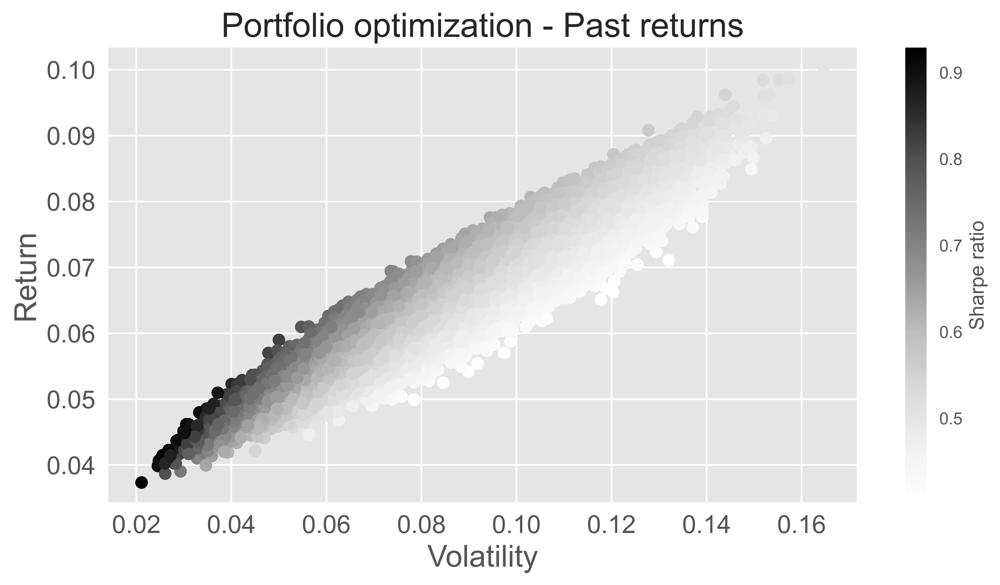

In [ ]:
plt.figure(figsize = (10,5))
plt.scatter(portfolio_risks, portfolio_returns, 
           c = (portfolio_returns - rf)/ portfolio_risks)
plt.title('Portfolio optimization - Past returns', fontsize = 20)
plt.xlabel('Volatility', fontsize = 18)
plt.ylabel('Return', fontsize = 18)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.colorbar(label = 'Sharpe ratio')
plt.show()

## Ottimizzazione con rendimenti attesi

### Creazione rendimenti attesi - Media di media e mediana delle previsioni a 1 anno del sondaggio - 30 giugno 2021

In [ ]:
d = {'LG13TREH': -0.005, 'LBEATREU':-0.007, 'LEGATREH': 0.0003, 'NDDUWI': 0.0664, 'MXWOHEUR': 0.0564,
     'NDUEEGF': 0.0883, 'NCUDWI': 0.07}
means_exp = pd.Series(data=d, index=['LG13TREH', 'LBEATREU', 'LEGATREH', 'NDDUWI', 'MXWOHEUR', 'NDUEEGF', 'NCUDWI'])
means_exp

LG13TREH   -0.0050
LBEATREU   -0.0070
LEGATREH    0.0003
NDDUWI      0.0664
MXWOHEUR    0.0564
NDUEEGF     0.0883
NCUDWI      0.0700
dtype: float64

### Ottimizzazione

In [ ]:
portfolio_returns = []
portfolio_risks = []
sharpe_ratios = []
portfolio_weights = []
rf_exp = -0.005

for portfolio in range(number_of_portfolios):
    weights = np.random.random_sample(len(returns.columns))
    weights =np.round((weights / np.sum(weights)), 3)
    portfolio_weights.append(weights)
    annualized_return = np.sum(means_exp * weights)
    portfolio_returns.append(annualized_return)
    portfolio_variance = np.dot(weights.T, np.dot(mat_cov, weights))
    portfolio_standard_deviation = np.sqrt(portfolio_variance)
    portfolio_risks.append(portfolio_standard_deviation)
    sharpe_ratio = (annualized_return - rf_exp) / portfolio_standard_deviation
    sharpe_ratios.append(sharpe_ratio)



In [ ]:
portfolio_returns = np.array(portfolio_returns)
portofolio_risks = np.array(portfolio_risks)
sharpe_ratios = np.array(sharpe_ratios)

In [ ]:
#portfoglio metrics

portfolio_metrics = [portfolio_returns, portfolio_risks, sharpe_ratios, portfolio_weights]
portfolios_df = pd.DataFrame(portfolio_metrics).T
portfolios_df.columns = ['Return', 'Risk', 'Sharpe', 'Weights']

min_risk = portfolios_df.iloc[portfolios_df['Risk'].astype(float).idxmin()]
highest_return = portfolios_df.iloc[portfolios_df['Return'].astype(float).idxmax()]
highest_sharpe = portfolios_df.iloc[portfolios_df['Sharpe'].astype(float).idxmax()]


In [ ]:
print('Lowest risk')
print(min_risk)
print(list(returns))
min_risk.to_excel('min_risk_exp.xlsx', sheet_name='Lowest risk', startrow=0)

print('')

print('Highest return')
print(highest_return)
print(list(returns))
highest_return.to_excel('high_ret_exp.xlsx', sheet_name='Highest return', startrow=0)


print('')
      
print('Highest Sharpe ratio')
print(highest_sharpe)
highest_sharpe.to_excel('high_sharpe_exp.xlsx', sheet_name='Highest Sharpe ', startrow=0)
print(list(returns))

print('')


Lowest risk
Return                                             0.001177
Risk                                               0.021749
Sharpe                                             0.283994
Weights    [0.363, 0.393, 0.161, 0.043, 0.02, 0.017, 0.003]
Name: 30018, dtype: object
['LG13TREH', 'LBEATREU', 'LEGATREH', 'NDDUWI', 'MXWOHEUR', 'NDUEEGF', 'NCUDWI']

Highest return
Return                                             0.072161
Risk                                               0.154279
Sharpe                                             0.500143
Weights    [0.013, 0.008, 0.03, 0.184, 0.174, 0.481, 0.111]
Name: 8568, dtype: object
['LG13TREH', 'LBEATREU', 'LEGATREH', 'NDDUWI', 'MXWOHEUR', 'NDUEEGF', 'NCUDWI']

Highest Sharpe ratio
Return                                               0.01315
Risk                                                0.032692
Sharpe                                              0.555178
Weights    [0.327, 0.009, 0.448, 0.122, 0.018, 0.019, 0.056]
Name: 26138, 

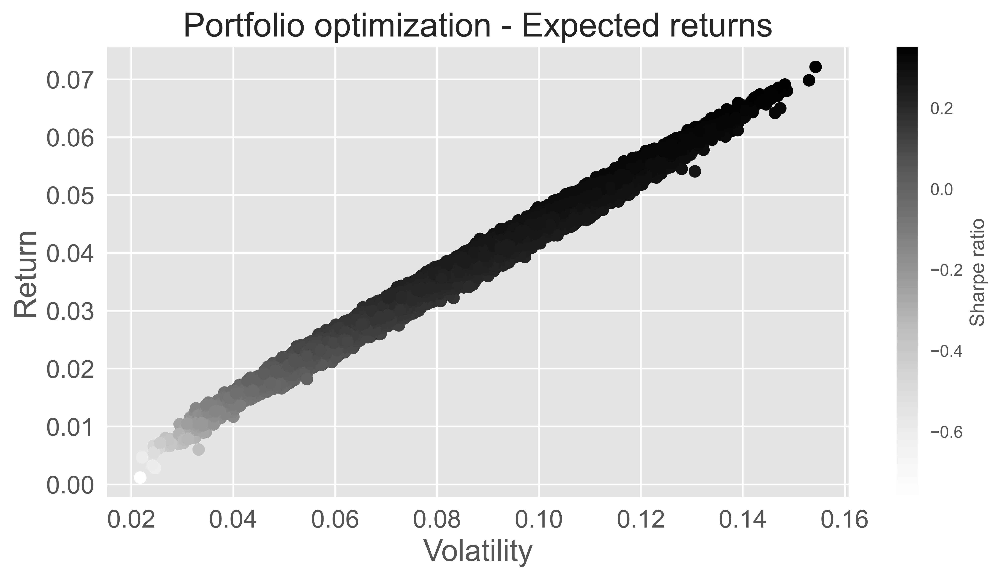

In [ ]:
plt.figure(figsize = (10,5))
plt.scatter(portfolio_risks, portfolio_returns, 
           c = (portfolio_returns - rf)/ portfolio_risks)
plt.title('Portfolio optimization - Expected returns', fontsize = 20)
plt.xlabel('Volatility', fontsize = 18)
plt.ylabel('Return', fontsize = 18)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.colorbar(label = 'Sharpe ratio')
plt.show()